<a href="https://colab.research.google.com/github/Nsad9579/Clinical-Projects/blob/main/CKD_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CKD project

## IMPORT PACKAGES

In [1]:
#as always 
import numpy as np 
import re
import matplotlib.style as style
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import warnings
#
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.preprocessing import LabelEncoder

from sklearn.impute import KNNImputer

from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score

from sklearn.decomposition import PCA

from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score

warnings.filterwarnings("ignore")
%matplotlib

Using matplotlib backend: agg


## IMPORT DATA

In [2]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d mansoordaku/ckdisease

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
mkdir: cannot create directory ‘/root/.kaggle’: File exists
ckdisease.zip: Skipping, found more recently modified local copy (use --force to force download)


In [3]:
! unzip /content/ckdisease.zip

Archive:  /content/ckdisease.zip
replace kidney_disease.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n


In [4]:
import pandas as pd 
data=pd.read_csv("/content/kidney_disease.csv")

### let's take a look at data

In [5]:
data.head(4)

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd


In [6]:
data.columns

Index(['id', 'age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr',
       'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane', 'classification'],
      dtype='object')

In [7]:
data.nunique().sort_values(ascending=False)

id                400
bgr               146
bu                118
hemo              115
wc                 92
sc                 84
age                76
rc                 49
pcv                44
pot                40
sod                34
bp                 10
su                  6
al                  6
sg                  5
dm                  5
cad                 3
classification      3
ba                  2
pcc                 2
pc                  2
rbc                 2
htn                 2
appet               2
pe                  2
ane                 2
dtype: int64

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              400 non-null    int64  
 1   age             391 non-null    float64
 2   bp              388 non-null    float64
 3   sg              353 non-null    float64
 4   al              354 non-null    float64
 5   su              351 non-null    float64
 6   rbc             248 non-null    object 
 7   pc              335 non-null    object 
 8   pcc             396 non-null    object 
 9   ba              396 non-null    object 
 10  bgr             356 non-null    float64
 11  bu              381 non-null    float64
 12  sc              383 non-null    float64
 13  sod             313 non-null    float64
 14  pot             312 non-null    float64
 15  hemo            348 non-null    float64
 16  pcv             330 non-null    object 
 17  wc              295 non-null    obj

In [9]:
data.describe()

,id,age,bp,sg,al,su,bgr,bu,sc,sod,pot,hemo
count,400.000000,391.000000,388.000000,353.000000,354.000000,351.000000,356.000000,381.000000,383.000000,313.000000,312.000000,348.000000
mean,199.500000,51.483376,76.469072,1.017408,1.016949,0.450142,148.036517,57.425722,3.072454,137.528754,4.627244,12.526437
std,115.614301,17.169714,13.683637,0.005717,1.352679,1.099191,79.281714,50.503006,5.741126,10.408752,3.193904,2.912587
min,0.000000,2.000000,50.000000,1.005000,0.000000,0.000000,22.000000,1.500000,0.400000,4.500000,2.500000,3.100000
25%,99.750000,42.000000,70.000000,1.010000,0.000000,0.000000,99.000000,27.000000,0.900000,135.000000,3.800000,10.300000
50%,199.500000,55.000000,80.000000,1.020000,0.000000,0.000000,121.000000,42.000000,1.300000,138.000000,4.400000,12.650000
75%,299.250000,64.500000,80.000000,1.020000,2.000000,0.000000,163.000000,66.000000,2.800000,142.000000,4.900000,15.000000
max,399.000000,90.000000,180.000000,1.025000,5.000000,5.000000,490.000000,391.000000,76.000000,163.000000,47.000000,17.800000


In [10]:
for x in data.drop("id",axis=1).columns:
  print(x,'\n',data[x].unique())

age 
 [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.]
bp 
 [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.]
sg 
 [1.02  1.01  1.005 1.015   nan 1.025]
al 
 [ 1.  4.  2.  3.  0. nan  5.]
su 
 [ 0.  3.  4.  1. nan  2.  5.]
rbc 
 [nan 'normal' 'abnormal']
pc 
 ['normal' 'abnormal' nan]
pcc 
 ['notpresent' 'present' nan]
ba 
 ['notpresent' 'present' nan]
bgr 
 [121.  nan 423. 117. 106.  74. 100. 410. 138.  70. 490. 380. 208.  98.
 157.  76.  99. 114. 263. 173.  95. 108. 156. 264. 123.  93. 107. 159.
 140. 171. 270.  92. 137. 204.  79. 207. 124. 144.  91. 162. 246. 253.
 141. 182.  86. 150. 146. 425. 112. 250. 360. 163. 129. 133. 102. 158.
 165. 132. 104. 127. 415. 169. 251. 109. 280. 210. 219. 295.  94. 172.
 101. 298. 1

In [11]:
numerical_cols=['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc']
categorical_cols=['rbc', 'pc', 'pcc', 'ba', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane']

you see them:( there are also some typos there Oh... we have a lot of work to do for cleaning!!!

## EDA(Data Profiling)

In [14]:
data.describe(include = 'all')

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
count,400.000000,391.000000,388.000000,353.000000,354.000000,351.000000,248,335,396,396,...,330,295,270,398,398,398,399,399,399,400
unique,NaN,NaN,NaN,NaN,NaN,NaN,2,2,2,2,...,44,92,49,2,5,3,2,2,2,3
top,NaN,NaN,NaN,NaN,NaN,NaN,normal,normal,notpresent,notpresent,...,41,9800,5.2,no,no,no,good,no,no,ckd
freq,NaN,NaN,NaN,NaN,NaN,NaN,201,259,354,374,...,21,11,18,251,258,362,317,323,339,248
mean,199.500000,51.483376,76.469072,1.017408,1.016949,0.450142,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,115.614301,17.169714,13.683637,0.005717,1.352679,1.099191,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,2.000000,50.000000,1.005000,0.000000,0.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,99.750000,42.000000,70.000000,1.010000,0.000000,0.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,199.500000,55.000000,80.000000,1.020000,0.000000,0.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,299.250000,64.500000,80.000000,1.020000,2.000000,0.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


now With this, we are done with the Structure-Based Exploratory Data Analysis and now it’s time to get into the Content Based Exploratory Data Analysis.

In [15]:
data.duplicated().sum()

0

## Preprocessing

### Data cleaning

#### dealing with typos

In [16]:
data=data.drop('id',axis=1)

In [17]:
for i in range(data.shape[0]):
  #for PCV 
  if data.iloc[i,15]=='\t?':
    data.iloc[i,15]=np.nan
  if data.iloc[i,15]=='\t43':
      data.iloc[i,15]='43'
  #for WC
  if data.iloc[i,16]=='\t?':
        data.iloc[i,16]=np.nan
  if data.iloc[i,16]=='\t6200':
      data.iloc[i,16]= '6200'
  if data.iloc[i,16]=='\t8400':
      data.iloc[i,16]= '8400'
  #for rc
  if data.iloc[i,17]=='\t?':
      data.iloc[i,17]=np.nan
  #for DM
  if data.iloc[i,20]=='\tno':
      data.iloc[i,20]='no'
  #for CAD
  if data.iloc[i,19] in [' yes','\tyes']:
      data.iloc[i,19]='yes'
  if data.iloc[i,19]=='\tno':
      data.iloc[i,19]='no'
  #for Classification 
  if data.iloc[i,24]=='ckd\t':
      data.iloc[i,24]='ckd'
  if data.iloc[i,24]=='ckd':
      data.iloc[i,24]=1
  if data.iloc[i,24]=='notckd':
      data.iloc[i,24]=0

OK WE're DONE here

#### dealing with mistyped features

In [18]:
#our mistyped are =['pcv','wc','rc']
data['pcv']=pd.to_numeric(data['pcv'])
data['wc']=pd.to_numeric(data['wc'])
data['rc']=pd.to_numeric(data['rc'])


In [19]:
#dividing features 
A=data.nunique()
categorical_cols=[x for x in data.columns if A[x]<4]
numeric_cols=[x for x in data.columns if x not in categorical_cols]
#this is just a rule for this dataset and I use =d it because I've seen the data so don't use it as a rule!!!

#### Handling missing values



Types of missingness
1. Missing Completely at Random (MCAR)
2. Missing at Random (MAR)
3. Missing Not at Random (MNAR)

1. Missing Completely at Random (MCAR)

    "Missingness has no relationship between any values, observed or missing"


2. Missing at Random (MAR)

    "There is a systematic relationship between missingness and other observed data, but not the missing data"



3. Missing Not at Random (MNAR)

    "There is a relationship between missingness and its values, missing or non-missing"

so first of all let's see what is the type of our missing values ... so we need some exploration and some visualization 

**for numerical values we have...**

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


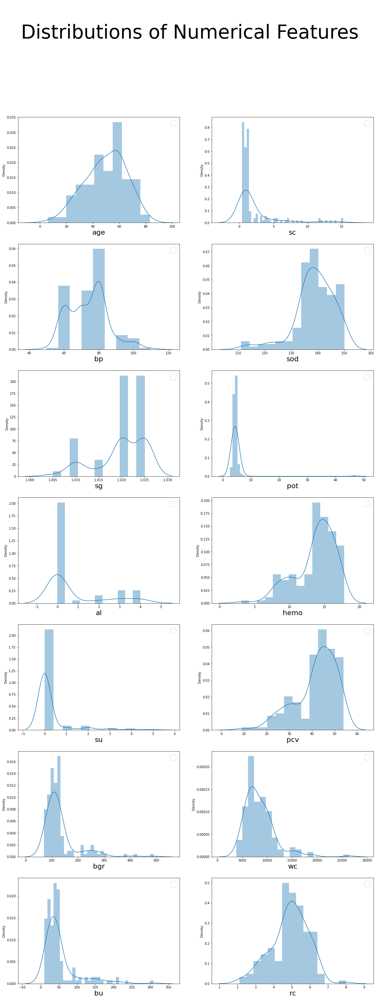

In [20]:
data1=data.dropna()
figure, axes = plt.subplots(7,2,figsize=(20, 50))
figure.suptitle('\nDistributions of Numerical Features', fontsize=60)

for index,cols in enumerate(numeric_cols):
  i,j=(index % 7),(index // 7)
  fig=sns.distplot(data1[cols],ax=axes[i,j])
  fig=fig.legend(loc='best', fontsize=22)
  axes[i,j].set_xlabel(cols,fontsize=22)
plt.show()

**what do we get from the plot?**


---



*   the distribution is really different between features and Some features show some very distant **outliers**.
*   Some features have discrete values, they are in reality continuous.
*   some features are very skewed while some others almost normal. 




**for categorical values we have...**

In [21]:
categorical_cols.remove('classification')


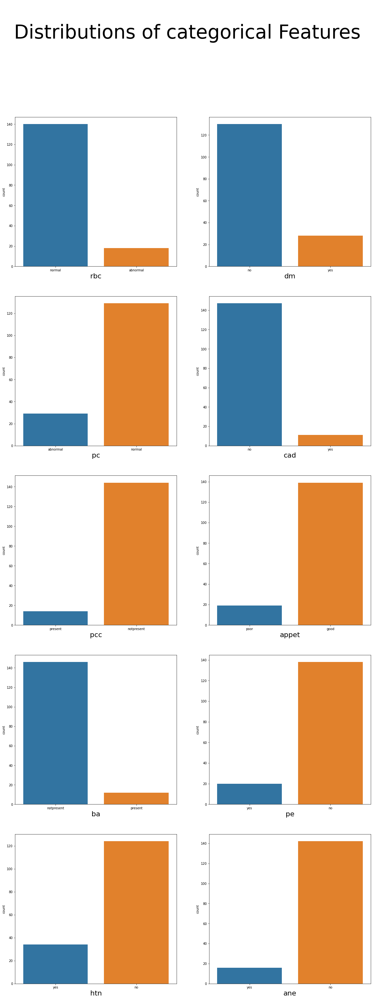

In [22]:
#style.use('seaborn-darkgrid')
data1=data.dropna()
figure, axes = plt.subplots(5,2,figsize=(20, 50))
figure.suptitle('\nDistributions of categorical Features', fontsize=60)

for index,cols in enumerate(categorical_cols):
  i,j=(index % 5),(index // 5)
  fig=sns.countplot(x=cols,data=data1,ax=axes[i,j])
  axes[i,j].set_xlabel(cols,fontsize=22)
plt.show()

**what do we get from the plot?**


---


*  Some features have very high percentages of missing values while some have almost none.
*  abselutely people with disease are more likely to progress the CKD


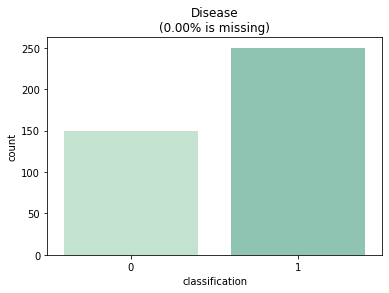

In [23]:
miss_perc="%.2f"%(100*(1-(data['classification'].dropna().shape[0])/data.shape[0]))
    
label="Disease\n(missing:\n{}%)".format(miss_perc)
fig=sns.countplot(x=data['classification'],label=label, palette=sns.cubehelix_palette(rot=-.35,light=0.85,hue=1))
plt.title("Disease\n({}% is missing)".format(miss_perc))
plt.show()

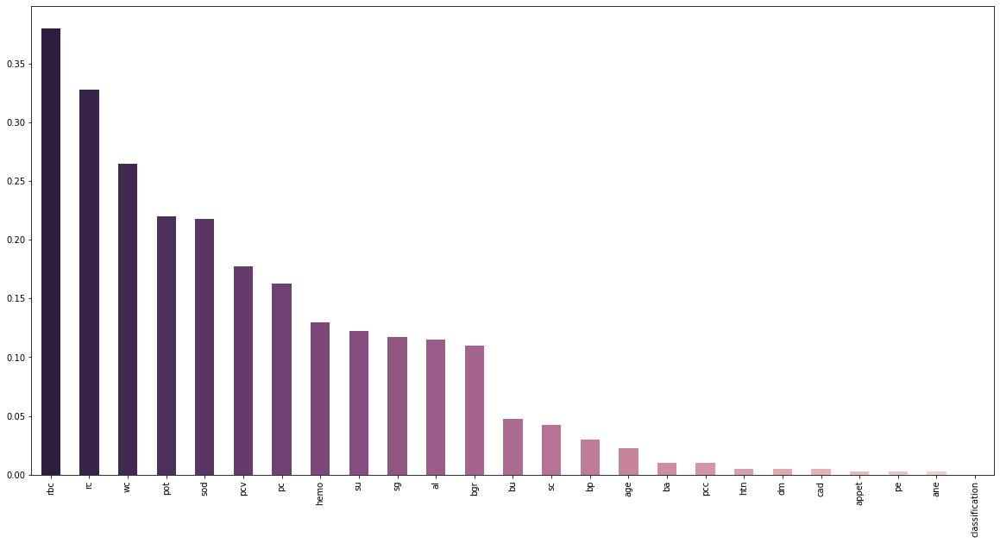

In [24]:
D=(data.isna().sum()/data.shape[0]).sort_values(ascending=False)
cmap = sns.cubehelix_palette(n_colors=24,reverse=True)
ax = D.plot(kind='bar', color=cmap,figsize=(20,10))

1.  detect the percentage of missing values in every column of the dataset 
2. barchart to show completeness of data
3. Detecting missingness pattern by sorting the variables in matrix chart and see the location of data
4. Mapping missingness to MCAR, MAR & MNAR

In [25]:
#1
#detect the percentage of missing values in every column of the dataset

number_ofmissing=data.isna().sum()
per_ofmissing= data.isna().sum() / len(data["age"]) *100
table=pd.concat([number_ofmissing,per_ofmissing],axis=1)
table.rename(columns = {0:'number of missing', 1:'percentage of the missing'}, inplace = True)
table.sort_values('number of missing')

,number of missing,percentage of the missing
classification,0,0.00
pe,1,0.25
appet,1,0.25
ane,1,0.25
cad,2,0.50
dm,2,0.50
htn,2,0.50
pcc,4,1.00
ba,4,1.00
age,9,2.25


#### ONEHOTE ENCODING

In [26]:
data2=data[numeric_cols]
encoder=LabelEncoder()
data1=data[categorical_cols].apply(encoder.fit_transform)
#and you simply realize that how smart is LabelEncoder which encodes every NaN to 2 and others to 0 and 1 : 
#yes=1, no=0 ; good=0 , poor=1 ; present=1 , notpresent=0 ; normal=1 , abnormal=0

In [27]:
data[categorical_cols]=data1

In [28]:
data[data[categorical_cols]==2]=np.nan

Ohhhhhhhhhhh we're done here finally ...     

#### scalling and normalizing

usually we do the scalling after the handling missing values but here because we want to Impute using distance based measure (eg. KNN), then it is recommended to first standardize the data and then Impute. That is because lower magnitude values converge faster.

In [29]:
NQT=QuantileTransformer(output_distribution='normal')
UQT=QuantileTransformer(output_distribution='uniform')
nspt=PowerTransformer(standardize=False) #
SPT=PowerTransformer()
RS=RobustScaler() 
WRS=RobustScaler(quantile_range=(15,85)) 
SS=StandardScaler()
MMS=MinMaxScaler()

NSPT=Pipeline(steps=[('PowerTransformer',nspt),('MinMaxScaler',MMS)])
Transformers={'NQT':NQT,'UQT':UQT,'NSPT':NSPT,'SPT':SPT,'RS':RS,'WRS':WRS,'SS':SS}

In [30]:
style.use('fivethirtyeight')
colors=['pink','blue','darkorange','purple','red','yellow','grey']

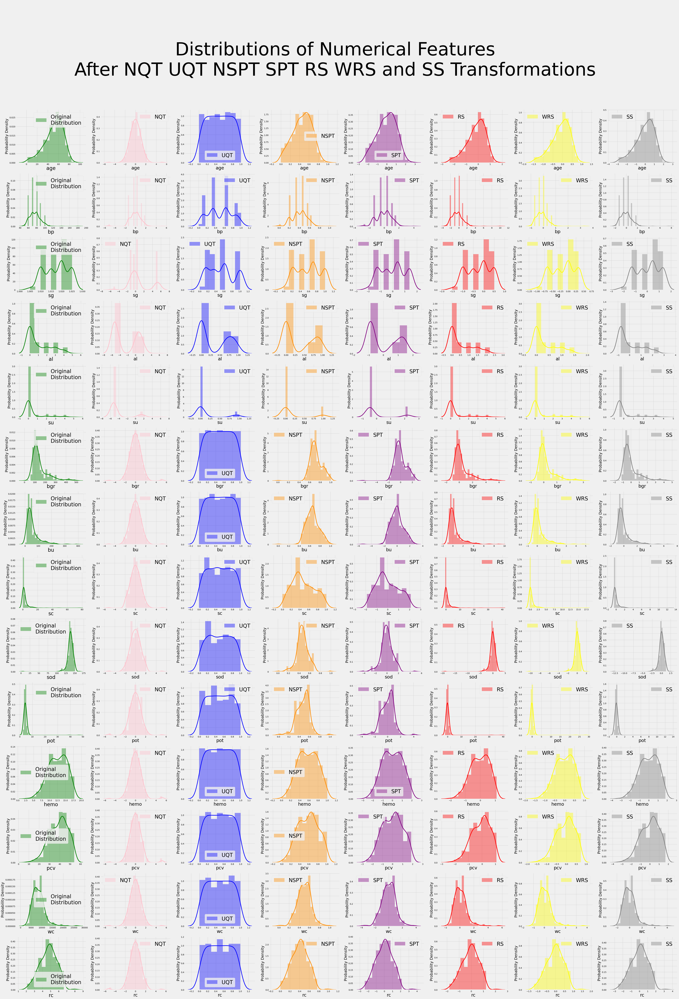

In [31]:
n_rows, n_cols = (14,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numerical Features\nAfter NQT UQT NSPT SPT RS WRS and SS Transformations', fontsize=120)
for i in range(14):
    fig = sns.distplot(data[numerical_cols].iloc[:,i], color="g", label='Original\nDistribution', norm_hist=True,
    
    ax=axes[i,0], kde_kws={"lw":4})
    
    fig=fig.legend(loc='best', fontsize=35)
    
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    
    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j,x in enumerate(list(Transformers.values())):
    label=list(Transformers.keys())[j]
    j=j+1
    for i in range(14):
        tmp=x.fit_transform(data[numerical_cols])
        dataframe=pd.DataFrame(tmp,columns=numerical_cols)
        fig = sns.distplot(dataframe.iloc[:,i], color=colors[j-1], label=label, norm_hist=True,

        ax=axes[i,j], kde_kws={"lw":4})
        
        fig=fig.legend(loc='best', fontsize=35)
    
        axes[i,j].set_ylabel("Probability Density",fontsize=25)
        
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=30)

plt.show()

**and What about categorical data?**


---

Any linear transformation of categorical values will not change either the **shape of the distribution** or the **correlation of scores** on that variable with those of any other variable.

So, there's really no standardizing that would make much sense for these data.

##### Solution

* ## Deletion
1. Listwise deletion:
  
  It is preferred when there is a **Missing Completely at Random** case.In Listwise deletion entire rows(which hold the missing values) are deleted. It is also known as complete-case analysis as it removes all data that have one or more missing values.

  ContranIndications:
  - if the size of the dataset is small
2. Pairwise Deletion:
  
  Pairwise Deletion is used if missingness is **Missing Completely at Random** i.e MCAR. It reduce the loss that happens in Listwise deletion. It is also called an available-case analysis as it removes only null observation, *not the entire row.*

3. Dropping complete columns

  If a column holds more than 80% missing values, and the feature is not meaningful, that time we can drop the entire column.


  
* ## Imputation
To build an accurate model of our application, we must first fill in any data gaps in our dataset.
A variety of sizes and shapes are offered in the form of imputations.
These are a few techniques:

1. Single Imputation: Only add missing values to the dataset once, to create an imputed dataset.

2. Univariate Imputation: This is the case in which only the target variable is used to generate the imputed values.
3. Numerous imputations: Duplicate missing value imputation across multiple rows of data. To get multiple imputed datasets, you must repeat a single imputation process.
4. Multivariate Imputation: Impute values based on other variables, such as estimating missing values using linear regression.

|  Type     | Solution |
| ----------- | ----------- |
| MNAR      |   Improve dataset find data       |
| MCAR   | Deleting rows or columns        |
| MAR   | Imputation of data        |



for more information visit [this](https://www.ncbi.nlm.nih.gov/books/NBK493614/) and [this](https://deeplearningmath.org/)



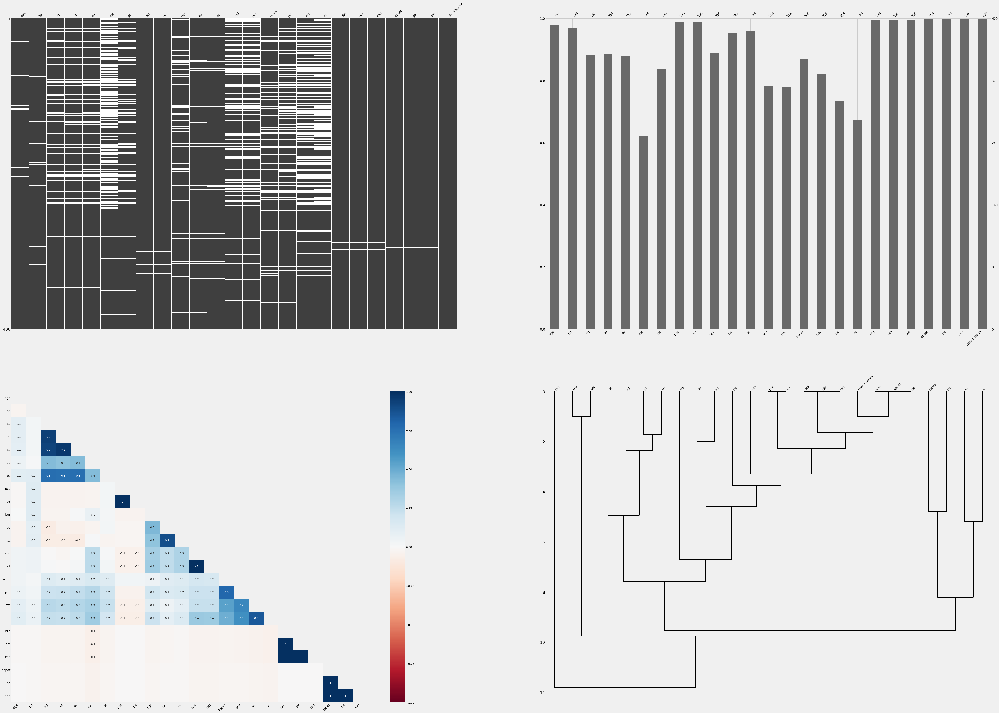

In [32]:
fig, axes = plt.subplots(2,2,figsize=(80,60))
msno.matrix(data,ax=axes[0, 0])
msno.bar(data,ax=axes[0, 1])
msno.heatmap(data,ax=axes[1,0])
msno.dendrogram(data,ax=axes[1, 1])

**Barchart**
The bar chart gives a quick graphical summary of the completeness of the dataset. We can observe that all of the columns except classification column have missing values.

**Matrix chart**
The matrx chart will help to visualize the location of the null observations. Once you get the location of the missing data, you can easily find out the type of missing data. 

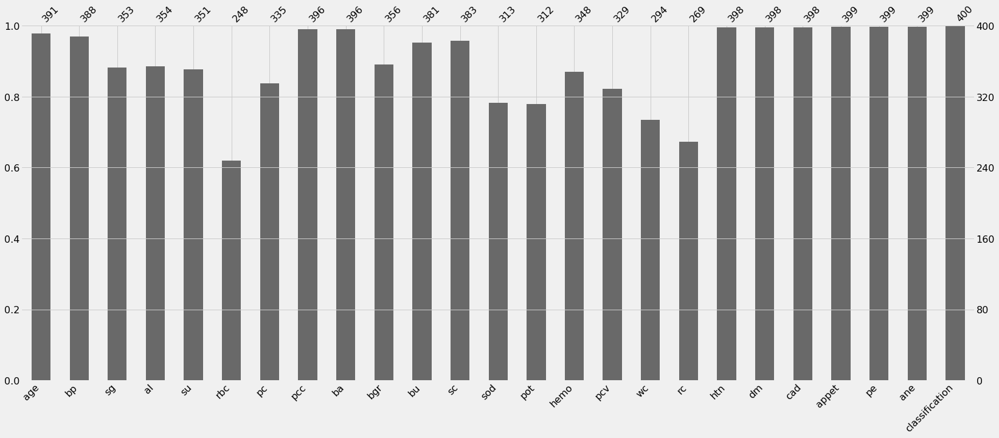

In [33]:
msno.bar(data)

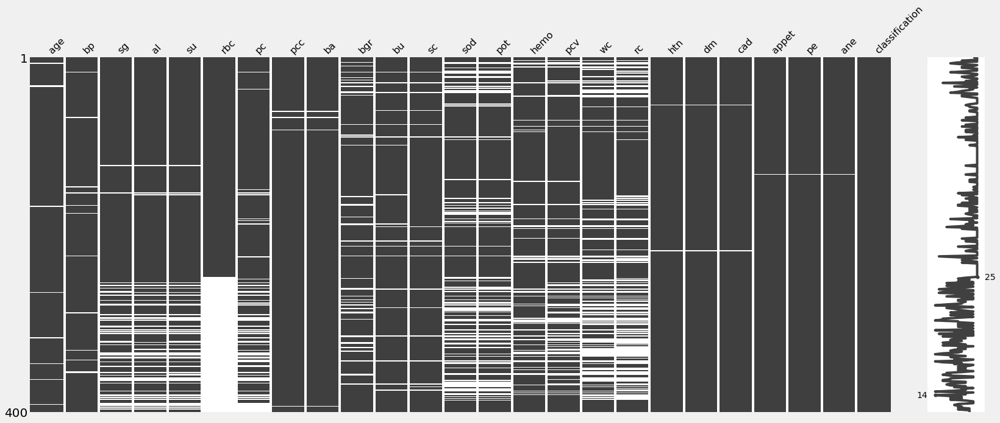

In [34]:
#3
sorted=data.sort_values("rbc")
msno.matrix(sorted)

well I couldn't figure out the patttern of missing values but I will with Imputation 

##### Imputation

In [35]:
data[categorical_cols]

,rbc,pc,pcc,ba,htn,dm,cad,appet,pe,ane
0,NaN,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
1,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
395,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
396,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
397,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
398,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


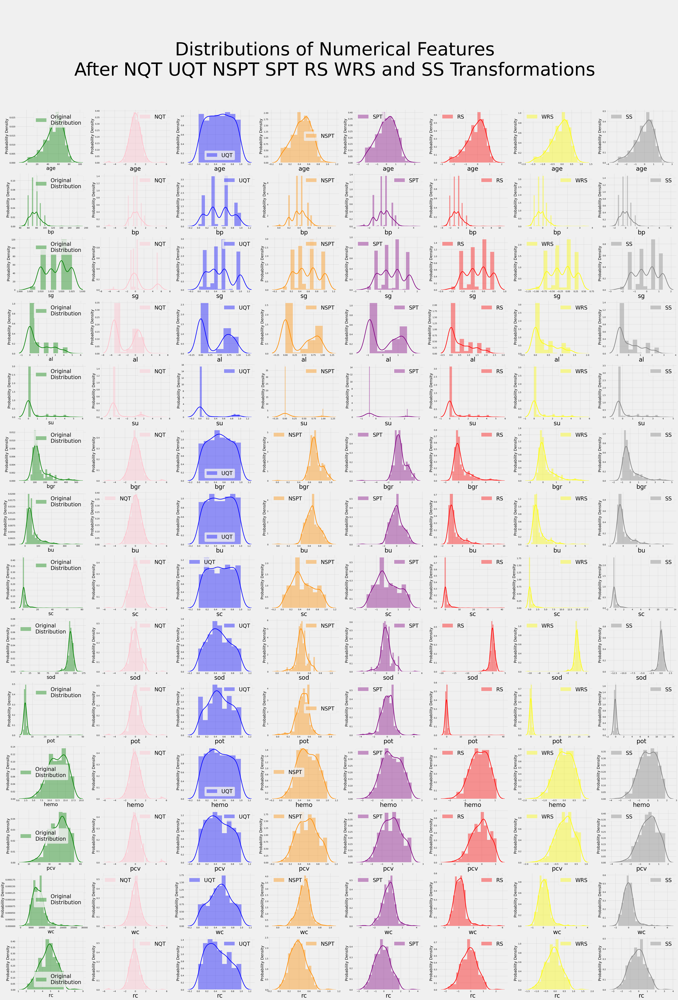

In [36]:
MY_KNN=KNNImputer(weights='distance', n_neighbors=8)
n_rows, n_cols = (14,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numerical Features\nAfter NQT UQT NSPT SPT RS WRS and SS Transformations', fontsize=120)
for i in range(14):
    fig = sns.distplot(data[numerical_cols].iloc[:,i], color="g", label='Original\nDistribution', norm_hist=True,
    
    ax=axes[i,0], kde_kws={"lw":4})
    
    fig=fig.legend(loc='best', fontsize=35)
    
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    
    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j,x in enumerate(list(Transformers.values())):
    label=list(Transformers.keys())[j]
    j=j+1
    for i in range(14):
        tmp=x.fit_transform(data[numerical_cols])
        tmp2=MY_KNN.fit_transform(tmp)
        dataframe=pd.DataFrame(tmp2,columns=numerical_cols)
        fig = sns.distplot(dataframe.iloc[:,i], color=colors[j-1], label=label, norm_hist=True,

        ax=axes[i,j], kde_kws={"lw":4})
        
        fig=fig.legend(loc='best', fontsize=35)
    
        axes[i,j].set_ylabel("Probability Density",fontsize=25)
        
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=40)

plt.show()

In [37]:
style.use('fivethirtyeight')
colors=['pink','blue','darkorange','purple','red','yellow','grey']

**for categorical features**


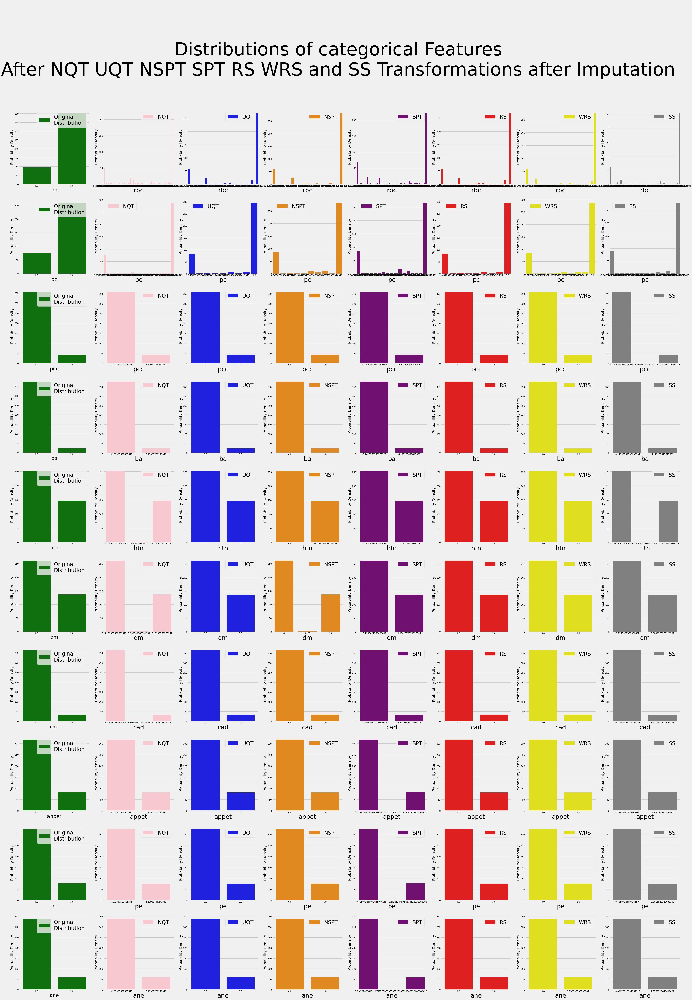

In [38]:
MY_KNN=KNNImputer(weights='distance', n_neighbors=8)
n_rows, n_cols = (10,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of categorical Features\nAfter NQT UQT NSPT SPT RS WRS and SS Transformations after Imputation', fontsize=120)
for i in range(10):
    fig = sns.countplot(data[categorical_cols].iloc[:,i], color="g", label='Original\nDistribution',ax=axes[i,0])
    
    fig=fig.legend(loc='best', fontsize=35)
    
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    
    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j,x in enumerate(list(Transformers.values())):
    label=list(Transformers.keys())[j]
    j=j+1
    for i in range(10):
        tmp=x.fit_transform(data[categorical_cols])
        tmp2=MY_KNN.fit_transform(tmp)
        dataframe=pd.DataFrame(tmp2,columns=categorical_cols)
        fig = sns.countplot(dataframe.iloc[:,i], color=colors[j-1], label=label,ax=axes[i,j])
        
        fig=fig.legend(loc='best', fontsize=35)
    
        axes[i,j].set_ylabel("Probability Density",fontsize=25)
        
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=40)

plt.show()

you see what happened for rbc and pc ????

we just need to put a threshold for that.

In [ ]:
data_100=data
for x in categorical_cols:
    col=data[x]
    for k in range(400):
        if data[x][k]>=0.5:
            col[k]=1
        else:
            col[k]=0
    data[x]=col

In [40]:
data

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,48.0,80.0,1.020,1.0,0.0,0.0,1.0,0.0,0.0,121.0,...,44.0,7800.0,5.2,1.0,1.0,0.0,0.0,0.0,0.0,1
1,7.0,50.0,1.020,4.0,0.0,0.0,1.0,0.0,0.0,NaN,...,38.0,6000.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1
2,62.0,80.0,1.010,2.0,3.0,1.0,1.0,0.0,0.0,423.0,...,31.0,7500.0,NaN,0.0,1.0,0.0,1.0,0.0,1.0,1
3,48.0,70.0,1.005,4.0,0.0,1.0,0.0,1.0,0.0,117.0,...,32.0,6700.0,3.9,1.0,0.0,0.0,1.0,1.0,1.0,1
4,51.0,80.0,1.010,2.0,0.0,1.0,1.0,0.0,0.0,106.0,...,35.0,7300.0,4.6,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,55.0,80.0,1.020,0.0,0.0,1.0,1.0,0.0,0.0,140.0,...,47.0,6700.0,4.9,0.0,0.0,0.0,0.0,0.0,0.0,0
396,42.0,70.0,1.025,0.0,0.0,1.0,1.0,0.0,0.0,75.0,...,54.0,7800.0,6.2,0.0,0.0,0.0,0.0,0.0,0.0,0
397,12.0,80.0,1.020,0.0,0.0,1.0,1.0,0.0,0.0,100.0,...,49.0,6600.0,5.4,0.0,0.0,0.0,0.0,0.0,0.0,0
398,17.0,60.0,1.025,0.0,0.0,1.0,1.0,0.0,0.0,114.0,...,51.0,7200.0,5.9,0.0,0.0,0.0,0.0,0.0,0.0,0




StandardScaler gave us better results so we went with that.

In [41]:
tmp=SS.fit_transform(data)
tmp2=MY_KNN.fit_transform(tmp)
df=pd.DataFrame(tmp2,columns=data.columns)

In [42]:
data_100=df
for x in categorical_cols:
    col=df[x]
    for k in range(400):
        if col[k]>=0.5:
            col[k]=1
        else:
            col[k]=0
    df[x]=col

In [43]:
df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,-0.203139,0.258373,0.454071,-0.012548,-0.410106,0.0,1.0,0.0,0.0,-0.341498,...,0.569881,-0.206202,0.481295,1.0,1.0,0.0,0.0,0.0,0.0,0.774597
1,-2.594124,-1.936857,0.454071,2.208413,-0.410106,0.0,1.0,0.0,0.0,-0.642023,...,-0.098536,-0.818559,0.244470,0.0,0.0,0.0,0.0,0.0,0.0,0.774597
2,0.613295,0.258373,-1.297699,0.727772,2.323069,1.0,1.0,0.0,0.0,3.473064,...,-0.878356,-0.308261,-0.624688,0.0,1.0,0.0,1.0,0.0,1.0,0.774597
3,-0.203139,-0.473370,-2.173584,2.208413,-0.410106,1.0,0.0,1.0,0.0,-0.392022,...,-0.766953,-0.580420,-0.788961,1.0,0.0,0.0,1.0,1.0,1.0,0.774597
4,-0.028189,0.258373,-1.297699,0.727772,-0.410106,1.0,1.0,0.0,0.0,-0.530963,...,-0.432744,-0.376301,-0.104977,0.0,0.0,0.0,0.0,0.0,0.0,0.774597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,0.205078,0.258373,0.454071,-0.752868,-0.410106,1.0,1.0,0.0,0.0,-0.101509,...,0.904090,-0.580420,0.188159,0.0,0.0,0.0,0.0,0.0,0.0,-1.290994
396,-0.553039,-0.473370,1.329955,-0.752868,-0.410106,1.0,1.0,0.0,0.0,-0.922524,...,1.683910,-0.206202,1.458415,0.0,0.0,0.0,0.0,0.0,0.0,-1.290994
397,-2.302541,0.258373,0.454071,-0.752868,-0.410106,1.0,1.0,0.0,0.0,-0.606749,...,1.126896,-0.614440,0.676719,0.0,0.0,0.0,0.0,0.0,0.0,-1.290994
398,-2.010957,-1.205114,1.329955,-0.752868,-0.410106,1.0,1.0,0.0,0.0,-0.429915,...,1.349701,-0.410321,1.165279,0.0,0.0,0.0,0.0,0.0,0.0,-1.290994


In [44]:
col=df['classification']
for k in range(400):
  if col[k]>=0.5:
    col[k]=1
  else:
    col[k]=0

In [45]:
df['classification']=col

In [46]:
df['classification']

0      1.0
1      1.0
2      1.0
3      1.0
4      1.0
      ... 
395    0.0
396    0.0
397    0.0
398    0.0
399    0.0
Name: classification, Length: 400, dtype: float64

## Modeling

#### Split data into train and test

In [47]:
df1=df.drop('classification',axis=1)

In [48]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(df1,df["classification"], test_size=0.4, random_state=12)

#### Ok let's run the models and compare the result ...


In [49]:
SVM_RBF=SVC()
    
SVM_Poly2=SVC(kernel='poly',degree=2)
    
SVM_Poly3=SVC(kernel='poly',degree=3)

KNN3=KNeighborsClassifier(n_neighbors=3,weights='distance')

KNN8=KNeighborsClassifier(n_neighbors=8,weights='distance')

KNN15=KNeighborsClassifier(n_neighbors=15,weights='distance')

Naive_Bayes=GaussianNB()

LogReg=LogisticRegression()

Tree=DecisionTreeClassifier()

Forest=RandomForestClassifier()

models=[SVM_RBF,SVM_Poly2,SVM_Poly3,KNN3,KNN8,KNN15,Naive_Bayes,LogReg,Tree,Forest]

names=["SVM_RBF","SVM_Poly2","SVM_Poly3","Weighted 3NearestNeighbors","Weighted 8NearestNeighbors",
       "Weighted 15NearestNeighbors","Naive Bayes","Logistic Regression","Decision Tree","Random Forest"]

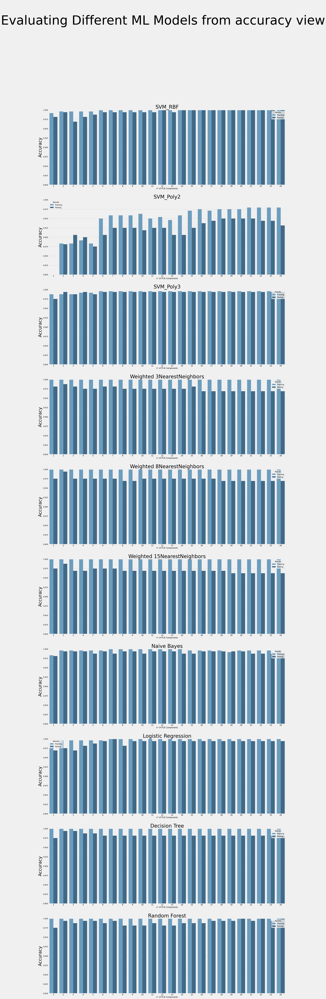

In [50]:
n_rows, n_cols= 10,1

figure, axes = plt.subplots(nrows=n_rows,ncols= n_cols, figsize=(30, 120))

figure.suptitle('\nEvaluating Different ML Models from accuracy view', fontsize=100)

tr_mask = np.empty(shape=(24,1),dtype="object")    
ts_mask = np.empty(shape=(24,1),dtype="object")

for i in range(24):
    tr_mask[i]="Training"
    ts_mask[i]="Testing"

mask = np.vstack((tr_mask,ts_mask))

mask=mask.reshape((48,))

cmps=[i for i in range(1,25)] * 2


for index in range(10):
    
    pca_tr_acc=[]
    pca_ts_acc=[]
    
    
    for n_comps in range(1,25):
        
        model=models[index]
        
        pca=PCA(n_components=n_comps)
        
        PCA__model=make_pipeline(pca,model)
        
        PCA__model.fit(X_train,Y_train)
        
        y_tr_pred= PCA__model.predict(X_train)
        
        pca_tr_acc.append(accuracy_score(y_tr_pred,Y_train))
        
        y_ts_pred=PCA__model.predict(X_test)
        
        pca_ts_acc.append(accuracy_score(y_ts_pred,Y_test))
        
    
    model_data = pd.DataFrame()
    
    model_data["PCA"] = pca_tr_acc + pca_ts_acc
        
    model_data["Results"] = mask
    
    sns.barplot(x=cmps, y="PCA", hue="Results", data=model_data, palette='Blues_d', ax=axes[index]).set(ylim=(0.8,1))
    
    axes[index].set_title(names[index],fontsize=40)
    
    axes[index].set_xlabel("n° of PCA Components",fontsize=15)
    
    axes[index].set_ylabel("Accuracy",fontsize=35)
    
    axes[index].set_xticklabels(axes[index].get_xticklabels(),fontsize=15)
    
plt.show()


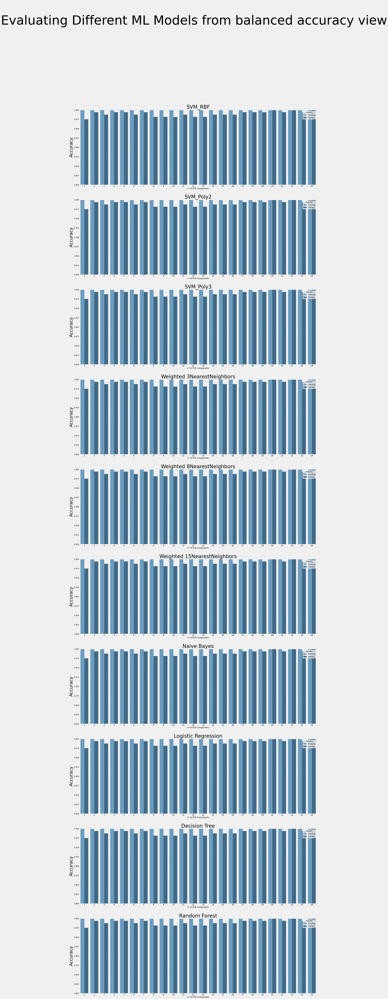

In [52]:
n_rows, n_cols= 10,1

figure, axes = plt.subplots(nrows=n_rows,ncols= n_cols, figsize=(30, 120))

figure.suptitle('\nEvaluating Different ML Models from balanced accuracy view', fontsize=100)

tr_mask = np.empty(shape=(24,1),dtype="object")    
ts_mask = np.empty(shape=(24,1),dtype="object")

for i in range(24):
    tr_mask[i]="Training"
    ts_mask[i]="Testing"

mask = np.vstack((tr_mask,ts_mask))

mask=mask.reshape((48,))

cmps=[i for i in range(1,25)] * 2


for index in range(10):
    
    pca_tr_balacc=[]
    pca_ts_balacc=[]
    
    
    for n_comps in range(1,25):
        
        model=models[index]
        
        pca=PCA(n_components=n_comps)
        
        PCA__model=make_pipeline(pca,model)
        
        PCA__model.fit(X_train,Y_train)
        
        y_tr_pred= PCA__model.predict(X_train)
        
        pca_tr_balacc.append(balanced_accuracy_score(y_tr_pred,Y_train))
        
        y_ts_pred=PCA__model.predict(X_test)
        
        pca_ts_balacc.append(balanced_accuracy_score(y_ts_pred,Y_test))
        
    
    model_data = pd.DataFrame()
    
    model_data["PCA"] = pca_tr_acc + pca_ts_acc
        
    model_data["Results"] = mask
    
    sns.barplot(x=cmps, y="PCA", hue="Results", data=model_data, palette='Blues_d', ax=axes[index]).set(ylim=(0.8,1))
    
    axes[index].set_title(names[index],fontsize=40)
    
    axes[index].set_xlabel("n° of PCA Components",fontsize=15)
    
    axes[index].set_ylabel("Accuracy",fontsize=35)
    
    axes[index].set_xticklabels(axes[index].get_xticklabels(),fontsize=15)
    
plt.show()


and This was the first version I will add many things to it in future...